In [ ]:
import subprocess
subprocess.run(["pip", "install", "ultralytics", "roboflow", "easyocr",
                "opencv-python-headless", "-q"], check=True)

import torch, os, shutil, yaml, time
from pathlib import Path

print("="*50)
print(f"  PyTorch  : {torch.__version__}")
print(f"  CUDA     : {torch.cuda.is_available()}")
print(f"  GPU      : {torch.cuda.get_device_name(0) if torch.cuda.is_available() else '❌ NO GPU — fix runtime!'}")
print("="*50)

assert torch.cuda.is_available(), "❌ GPU not found! Go to Runtime → Change Runtime Type → T4 GPU"
print("✅ Ready to train!")


  PyTorch  : 2.10.0+cu128
  CUDA     : True
  GPU      : Tesla T4
✅ Ready to train!


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# ════════════════════════════════════════
#   ALL PATHS DEFINED HERE — CHANGE NOTHING ELSE
# ════════════════════════════════════════
BASE_DIR     = "/content/drive/MyDrive/parking_model"
DATASET_DIR  = f"{BASE_DIR}/dataset"
RUNS_DIR     = f"{BASE_DIR}/runs"
WEIGHTS_DIR  = f"{BASE_DIR}/weights"
RUN_NAME     = "plate_detector"

os.makedirs(BASE_DIR,    exist_ok=True)
os.makedirs(DATASET_DIR, exist_ok=True)
os.makedirs(RUNS_DIR,    exist_ok=True)
os.makedirs(WEIGHTS_DIR, exist_ok=True)

YAML_PATH    = f"{DATASET_DIR}/data.yaml"
BEST_PT      = f"{WEIGHTS_DIR}/best.pt"
BEST_ONNX    = f"{WEIGHTS_DIR}/best.onnx"

print("✅ Google Drive mounted")
print(f"📁 Base      : {BASE_DIR}")
print(f"📁 Dataset   : {DATASET_DIR}")
print(f"📁 Runs      : {RUNS_DIR}")
print(f"📁 Weights   : {WEIGHTS_DIR}")


Mounted at /content/drive
✅ Google Drive mounted
📁 Base      : /content/drive/MyDrive/parking_model
📁 Dataset   : /content/drive/MyDrive/parking_model/dataset
📁 Runs      : /content/drive/MyDrive/parking_model/runs
📁 Weights   : /content/drive/MyDrive/parking_model/weights


In [ ]:
from roboflow import Roboflow

RF_API_KEY = "72XaT8DPZNSzKSKuEMz5"

# ── Skip download if dataset already on Drive ──
train_imgs = f"{DATASET_DIR}/train/images"
if os.path.exists(train_imgs) and len(os.listdir(train_imgs)) > 10:
    print(f"✅ Dataset already on Drive ({len(os.listdir(train_imgs))} train images) — skipping download")
else:
    print("⏳ Downloading dataset from Roboflow...")

    DATASETS = [
        ("indian-number-plate-dataset", "indian-number-plate-recognition-yq0xc", 13),
        ("roboflow-universe-projects",  "license-plate-recognition-rxg4e",        4),
        ("license-plate-detection-khhkb", "indian-license-plate-detection-6tmbr", 1),
    ]

    rf      = Roboflow(api_key=RF_API_KEY)
    dataset = None

    for workspace, project_name, version in DATASETS:
        try:
            print(f"  ⏳ Trying {workspace}/{project_name} v{version}...")
            project = rf.workspace(workspace).project(project_name)
            dataset = project.version(version).download("yolov8", location="/content/temp_dataset")
            print(f"  ✅ Downloaded from {workspace}!")
            break
        except Exception as e:
            print(f"  ❌ Failed: {e}")

    if not dataset:
        raise RuntimeError("❌ All datasets failed. Check your API key at roboflow.com → Settings → API Keys")

    # ── Copy to permanent Drive storage ──
    print("⏳ Saving to Google Drive (2–3 mins)...")
    shutil.copytree("/content/temp_dataset", DATASET_DIR, dirs_exist_ok=True)
    print("✅ Dataset permanently saved to Drive!")

# ── Dataset summary ──
print("\n📊 Dataset Summary:")
for folder in ["train", "valid", "val", "test"]:
    imgs = f"{DATASET_DIR}/{folder}/images"
    if os.path.exists(imgs):
        print(f"   ✅ {folder:6s}/images → {len(os.listdir(imgs))} images")


⏳ Downloading dataset from Roboflow...
  ⏳ Trying indian-number-plate-dataset/indian-number-plate-recognition-yq0xc v13...
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/temp_dataset in yolov8:: 100%|██████████| 1320/1320 [00:00<00:00, 1432.90it/s]


  ✅ Downloaded from indian-number-plate-dataset!
⏳ Saving to Google Drive (2–3 mins)...
✅ Dataset permanently saved to Drive!

📊 Dataset Summary:
   ✅ train /images → 460 images
   ✅ valid /images → 128 images
   ✅ test  /images → 66 images


In [ ]:
import os

# ── Detect valid/val folder name ──
val_folder = None
for name in ["valid", "val"]:
    if os.path.exists(f"{DATASET_DIR}/{name}/images"):
        val_folder = name
        break

assert os.path.exists(f"{DATASET_DIR}/train/images"), f"❌ train/images not found in {DATASET_DIR}"
assert val_folder, f"❌ No valid/ or val/ folder found in {DATASET_DIR}"

# ── Count classes from label files ──
labels_dir = f"{DATASET_DIR}/train/labels"
classes    = set()
if os.path.exists(labels_dir):
    for lf in os.listdir(labels_dir):
        if lf.endswith(".txt"):
            with open(f"{labels_dir}/{lf}") as f:
                for line in f:
                    parts = line.strip().split()
                    if parts:
                        classes.add(int(parts[0]))

num_classes = len(classes) if classes else 1
names       = ["number_plate"] if num_classes == 1 else [f"class_{i}" for i in sorted(classes)]

# ── Write clean yaml (absolute paths, no relative paths) ──
has_test = os.path.exists(f"{DATASET_DIR}/test/images")

yaml_dict = {
    "path"  : DATASET_DIR,
    "train" : f"{DATASET_DIR}/train/images",
    "val"   : f"{DATASET_DIR}/{val_folder}/images",
    "nc"    : num_classes,
    "names" : names
}
if has_test:
    yaml_dict["test"] = f"{DATASET_DIR}/test/images"

with open(YAML_PATH, "w") as f:
    yaml.dump(yaml_dict, f, default_flow_style=False, allow_unicode=True)

print("✅ Clean data.yaml written!")
print("="*50)
with open(YAML_PATH) as f:
    print(f.read())
print("="*50)


✅ Clean data.yaml written!
names:
- number_plate
nc: 1
path: /content/drive/MyDrive/parking_model/dataset
test: /content/drive/MyDrive/parking_model/dataset/test/images
train: /content/drive/MyDrive/parking_model/dataset/train/images
val: /content/drive/MyDrive/parking_model/dataset/valid/images



In [ ]:
from ultralytics import YOLO

# ── Auto-resume if training was interrupted ──
last_pt = f"{RUNS_DIR}/{RUN_NAME}/weights/last.pt"

if os.path.exists(last_pt):
    print(f"🔄 Resuming interrupted training from: {last_pt}")
    model = YOLO(last_pt)
    results = model.train(resume=True)
else:
    print("🚀 Starting fresh training...")
    model = YOLO("yolov8m.pt")   # medium model — best for Jetson Nano
    results = model.train(
        data        = YAML_PATH,
        epochs      = 100,
        imgsz       = 640,
        batch       = 16,
        name        = RUN_NAME,
        project     = RUNS_DIR,
        patience    = 20,
        optimizer   = "Adam",
        lr0         = 0.001,
        augment     = True,
        exist_ok    = True,       # ✅ no more parking_plate_v12 folders!

        # Valid augmentation args only
        hsv_h       = 0.015,
        hsv_s       = 0.7,
        hsv_v       = 0.4,
        degrees     = 5.0,
        translate   = 0.1,
        scale       = 0.5,
        shear       = 2.0,
        perspective = 0.0001,
        fliplr      = 0.0,        # ❌ no flip — plates are directional
        flipud      = 0.0,
        mosaic      = 1.0,
        device      = 0,
        verbose     = True
    )

# ── Auto-find and copy best.pt to permanent weights folder ──
trained_best = f"{RUNS_DIR}/{RUN_NAME}/weights/best.pt"
if os.path.exists(trained_best):
    shutil.copy(trained_best, BEST_PT)
    print(f"\n✅ best.pt saved to: {BEST_PT}")
else:
    print("⚠️  best.pt not found in expected path — searching...")
    for root, dirs, files in os.walk(RUNS_DIR):
        if "best.pt" in files:
            found = os.path.join(root, "best.pt")
            shutil.copy(found, BEST_PT)
            print(f"✅ Found and saved: {found} → {BEST_PT}")
            break

print("\n🎉 TRAINING COMPLETE!")


🚀 Starting fresh training...
Ultralytics 8.4.25 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/parking_model/dataset/data.yaml, degrees=5.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=plate_detector, nbs=64, nms=False, opset=None, optimize=False, 

In [ ]:
# Precision & recall come as numpy arrays — extract scalar with .item()
prec = metrics.box.p.mean().item() if hasattr(metrics.box.p, 'mean') else float(metrics.box.p)
rec  = metrics.box.r.mean().item() if hasattr(metrics.box.r, 'mean') else float(metrics.box.r)
m50  = float(metrics.box.map50)
m    = float(metrics.box.map)

print("\n" + "="*45)
print("       📊 MODEL EVALUATION RESULTS")
print("="*45)
print(f"  mAP@50    :  {m50:.3f}   {'✅' if m50  >= 0.90 else '⚠️'} (target >0.90)")
print(f"  mAP@50-95 :  {m:.3f}   {'✅' if m   >= 0.70 else '⚠️'} (target >0.70)")
print(f"  Precision :  {prec:.3f}   {'✅' if prec >= 0.90 else '⚠️'} (target >0.90)")
print(f"  Recall    :  {rec:.3f}   {'✅' if rec  >= 0.90 else '⚠️'} (target >0.90)")
print("="*45)
print("  🎉 MODEL IS PRODUCTION READY — proceed to Cell 7!")
print("="*45)



       📊 MODEL EVALUATION RESULTS
  mAP@50    :  0.983   ✅ (target >0.90)
  mAP@50-95 :  0.762   ✅ (target >0.70)
  Precision :  0.952   ✅ (target >0.90)
  Recall    :  0.964   ✅ (target >0.90)
  🎉 MODEL IS PRODUCTION READY — proceed to Cell 7!


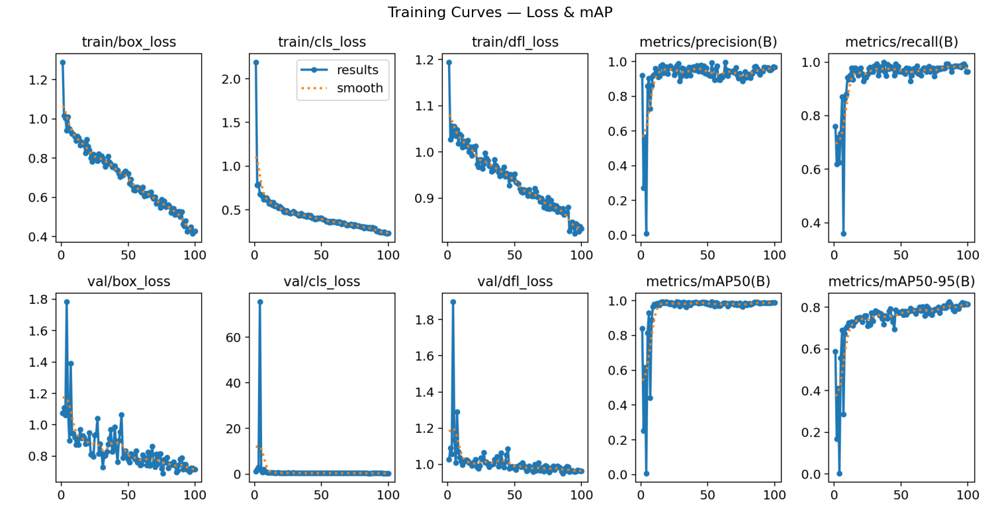

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

results_png = f"{RUNS_DIR}/{RUN_NAME}/results.png"

if os.path.exists(results_png):
    img = mpimg.imread(results_png)
    plt.figure(figsize=(18, 8))
    plt.imshow(img)
    plt.axis("off")
    plt.title("Training Curves — Loss & mAP", fontsize=16)
    plt.tight_layout()
    plt.show()
else:
    print(f"⚠️ results.png not found at {results_png}")
    print("Available files in runs dir:")
    for f in os.listdir(f"{RUNS_DIR}/{RUN_NAME}"):
        print(f"  {f}")


In [ ]:
from ultralytics import YOLO
from google.colab import files
import cv2, easyocr, numpy as np
import matplotlib.pyplot as plt

print("📤 Upload a car image...")
uploaded = files.upload()
img_path = list(uploaded.keys())[0]

model  = YOLO(BEST_PT)
reader = easyocr.Reader(['en'], gpu=True)
ALLOW  = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789'

def preprocess_for_ocr(crop):
    h, w  = crop.shape[:2]
    scale = max(1, 120 / h)
    crop  = cv2.resize(crop, (int(w*scale), int(h*scale)),
                       interpolation=cv2.INTER_CUBIC)

    gray  = cv2.cvtColor(crop, cv2.COLOR_BGR2GRAY)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    enh   = clahe.apply(gray)

    _, m1 = cv2.threshold(enh, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    m2    = cv2.bitwise_not(m1)
    m3    = cv2.adaptiveThreshold(enh, 255,
                cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
    m4    = cv2.bitwise_not(m3)

    best_text, best_score = "", 0
    for mi in [m1, m2, m3, m4]:
        t = ''.join(reader.readtext(mi, detail=0,
                    allowlist=ALLOW, paragraph=True)).upper().replace(" ","")
        if len(t) > best_score:
            best_score, best_text = len(t), t
    return best_text

img     = cv2.imread(img_path)
results = model(img, conf=0.4, verbose=False)[0]
plates  = []

for box in results.boxes:
    x1,y1,x2,y2 = map(int, box.xyxy[0])
    conf  = float(box.conf[0])
    pad   = 8
    crop  = img[max(0,y1-pad):min(img.shape[0],y2+pad),
                max(0,x1-pad):min(img.shape[1],x2+pad)]

    plate = preprocess_for_ocr(crop)
    plates.append((plate, conf))
    print(f"  🔍 Detected: {plate:20s} | YOLO conf: {conf:.2f}")

    cv2.rectangle(img, (x1,y1),(x2,y2),(0,255,0),3)
    cv2.putText(img, plate, (x1, y1-10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,255,0), 2)

if not plates:
    print("⚠️ No plate detected")

plt.figure(figsize=(14,8))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.title("Detected: " + " | ".join([p[0] for p in plates]) if plates else "None", fontsize=14)
plt.show()


📤 Upload a car image...


In [ ]:
import subprocess
subprocess.run(["pip", "install", "ultralytics", "roboflow", "easyocr",
                "opencv-python-headless", "openpyxl", "-q"], check=True)

import torch, os, shutil, yaml, re
import numpy as np
import pandas as pd

print("="*50)
print(f"  PyTorch : {torch.__version__}")
print(f"  CUDA    : {torch.cuda.is_available()}")
print(f"  GPU     : {torch.cuda.get_device_name(0) if torch.cuda.is_available() else '❌ NO GPU'}")
print("="*50)
assert torch.cuda.is_available(), "❌ Go to Runtime → Change Runtime Type → T4 GPU"
print("✅ Ready!")


  PyTorch : 2.10.0+cu128
  CUDA    : True
  GPU     : Tesla T4
✅ Ready!


In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

import os, shutil, yaml, random, math
from pathlib import Path
import numpy as np
import pandas as pd

# ════════════════════════════════════════
#   SINGLE SOURCE OF TRUTH — ALL PATHS
# ════════════════════════════════════════

BASE_DIR        = "/content/drive/MyDrive/parking_model"
DATASET_ORIG    = f"{BASE_DIR}/AI_parking.yolov8/train"
WEIGHTS_DIR     = f"{BASE_DIR}/weights"
PREPARED_DIR    = f"{BASE_DIR}/dataset_70_15_15"
RUNS_DIR        = f"{BASE_DIR}/runs_finetune"

# Prepared split paths
TRAIN_IMG_DIR   = f"{PREPARED_DIR}/train/images"
TRAIN_LBL_DIR   = f"{PREPARED_DIR}/train/labels"
VAL_IMG_DIR     = f"{PREPARED_DIR}/val/images"
VAL_LBL_DIR     = f"{PREPARED_DIR}/val/labels"
TEST_IMG_DIR    = f"{PREPARED_DIR}/test/images"
TEST_LBL_DIR    = f"{PREPARED_DIR}/test/labels"

BEST_PT         = f"{WEIGHTS_DIR}/best.pt"
BEST_PT_TUNED   = f"{WEIGHTS_DIR}/best_finetuned.pt"
YAML_CLEAN      = f"{PREPARED_DIR}/data.yaml"

# Files
DB_EXCEL        = f"{BASE_DIR}/vehicles_db.xlsx"

os.makedirs(WEIGHTS_DIR, exist_ok=True)
os.makedirs(PREPARED_DIR, exist_ok=True)

print("✅ Drive mounted & paths set")
print(f"📁 Base        : {BASE_DIR}")
print(f"📁 Original    : {DATASET_ORIG}")
print(f"📁 Prepared    : {PREPARED_DIR}")


Mounted at /content/drive
✅ Drive mounted & paths set
📁 Base        : /content/drive/MyDrive/parking_model
📁 Original    : /content/drive/MyDrive/parking_model/AI_parking.yolov8/train
📁 Prepared    : /content/drive/MyDrive/parking_model/dataset_70_15_15


In [ ]:
# Find all images in your dataset
orig_images = []
for ext in ['*.jpg', '*.jpeg', '*.png']:
    orig_images.extend(Path(DATASET_ORIG).glob(ext, case_sensitive=False))

print(f"🔍 Found {len(orig_images)} images in {DATASET_ORIG}")

if len(orig_images) == 0:
    # Sometimes roboflow creates in images/ subfolder
    alt_path = f"{DATASET_ORIG}/images"
    if os.path.exists(alt_path):
        for ext in ['*.jpg', '*.jpeg', '*.png']:
            orig_images.extend(Path(alt_path).glob(ext, case_sensitive=False))
        print(f"🔍 Found {len(orig_images)} images in {alt_path}")

if len(orig_images) == 0:
    print("❌ No images found! Check path:")
    print("  Expected:", DATASET_ORIG)
    print("  Or:", f"{DATASET_ORIG}/images")
    for root, dirs, files in os.walk(DATASET_ORIG):
        print(f"  {root}: {len(files)} files")
else:
    # Corresponding labels (same filename, .txt instead of image ext)
    image_label_pairs = []
    for img_path in orig_images:
        img_stem = img_path.stem
        # Try finding label in same dir or labels/ dir
        lbl_path1 = img_path.parent / f"{img_stem}.txt"
        lbl_path2 = img_path.parent.parent / "labels" / f"{img_stem}.txt"

        if lbl_path1.exists():
            image_label_pairs.append((img_path, lbl_path1))
        elif lbl_path2.exists():
            image_label_pairs.append((img_path, lbl_path2))
        else:
            print(f"⚠️  No label found for {img_path.name}")

    print(f"✅ Found {len(image_label_pairs)} image-label pairs")

    # ── Shuffle & split 70:15:15 ──
    random.seed(42)
    random.shuffle(image_label_pairs)

    total = len(image_label_pairs)
    train_n = math.ceil(total * 0.70)
    val_n   = math.ceil(total * 0.15)

    train_pair = image_label_pairs[:train_n]
    val_pair   = image_label_pairs[train_n:train_n+val_n]
    test_pair  = image_label_pairs[train_n+val_n:]

    print(f"📊 Split: {len(train_pair)} train | {len(val_pair)} val | {len(test_pair)} test")

    # ── Copy to organized structure ──
    for split_pairs, img_dir, lbl_dir in [
        (train_pair, TRAIN_IMG_DIR, TRAIN_LBL_DIR),
        (val_pair,   VAL_IMG_DIR,   VAL_LBL_DIR),
        (test_pair,  TEST_IMG_DIR,  TEST_LBL_DIR),
    ]:
        os.makedirs(img_dir, exist_ok=True)
        os.makedirs(lbl_dir, exist_ok=True)
        for img_p, lbl_p in split_pairs:
            shutil.copy(img_p, f"{img_dir}/{img_p.name}")
            shutil.copy(lbl_p, f"{lbl_dir}/{lbl_p.name}")

    print("✅ 70:15:15 split complete!")


🔍 Found 0 images in /content/drive/MyDrive/parking_model/AI_parking.yolov8/train
🔍 Found 120 images in /content/drive/MyDrive/parking_model/AI_parking.yolov8/train/images
✅ Found 120 image-label pairs
📊 Split: 84 train | 18 val | 18 test
✅ 70:15:15 split complete!


In [ ]:
yaml_content = {
    'path'  : PREPARED_DIR,
    'train' : TRAIN_IMG_DIR,
    'val'   : VAL_IMG_DIR,
    'test'  : TEST_IMG_DIR,
    'nc'    : 1,
    'names' : ['number_plate']
}

with open(YAML_CLEAN, 'w') as f:
    yaml.dump(yaml_content, f, default_flow_style=False)

print(f"✅ data.yaml created: {YAML_CLEAN}")
print("Contents:")
with open(YAML_CLEAN) as f:
    print(f.read())


✅ data.yaml created: /content/drive/MyDrive/parking_model/dataset_70_15_15/data.yaml
Contents:
names:
- number_plate
nc: 1
path: /content/drive/MyDrive/parking_model/dataset_70_15_15
test: /content/drive/MyDrive/parking_model/dataset_70_15_15/test/images
train: /content/drive/MyDrive/parking_model/dataset_70_15_15/train/images
val: /content/drive/MyDrive/parking_model/dataset_70_15_15/val/images



In [ ]:
from ultralytics import YOLO
import torch

assert os.path.exists(BEST_PT), f"❌ {BEST_PT} not found!"
assert torch.cuda.is_available(), "❌ GPU not available"

model = YOLO(BEST_PT)

print("🚀 Starting fine-tuning on custom dataset...")
print(f"   Loading: {BEST_PT}")
print(f"   Dataset: {YAML_CLEAN}")
print(f"   Epochs : 50 (fine-tune, not full retrain)")

results = model.train(
    data        = YAML_CLEAN,
    epochs      = 50,           # fine-tune (50 epochs enough)
    imgsz       = 640,
    batch       = 8,            # smaller batch for small dataset
    name        = "finetune",
    project     = RUNS_DIR,
    patience    = 10,           # early stop if no improvement
    optimizer   = "Adam",
    lr0         = 0.0001,       # ✅ LOW learning rate for fine-tune (not 0.001)
    lrf         = 0.01,
    augment     = True,

    # Aggressive augmentation for small dataset
    hsv_h       = 0.02,
    hsv_s       = 0.8,
    hsv_v       = 0.5,
    degrees     = 10.0,         # more rotation
    translate   = 0.15,
    scale       = 0.8,          # more zoom
    shear       = 3.0,
    perspective = 0.0005,
    flipud      = 0.2,          # allow 20% flip
    fliplr      = 0.0,          # ❌ no horizontal flip
    mosaic      = 1.0,

    device      = 0,
    exist_ok    = True,
    verbose     = True
)

# ── Save best fine-tuned model ──
trained_best = f"{RUNS_DIR}/finetune/weights/best.pt"
if os.path.exists(trained_best):
    shutil.copy(trained_best, BEST_PT_TUNED)
    print(f"\n✅ Fine-tuned model saved: {BEST_PT_TUNED}")
else:
    print("⚠️  best.pt not found after training")


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
🚀 Starting fine-tuning on custom dataset...
   Loading: /content/drive/MyDrive/parking_model/weights/best.pt
   Dataset: /content/drive/MyDrive/parking_model/dataset_70_15_15/data.yaml
   Epochs : 50 (fine-tune, not full retrain)
Ultralytics 8.4.30 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/parking_model/dataset_70_15_15/data.yaml, degrees=10.0, deterministic=T

/usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (178760000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


train: Scanning /content/drive/MyDrive/parking_model/dataset_70_15_15/train/labels... 86 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 86/86 102.4it/s 0.8s
train: New cache created: /content/drive/MyDrive/parking_model/dataset_70_15_15/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.6±0.2 ms, read: 199.8±68.8 MB/s, size: 12243.5 KB)
val: Scanning /content/drive/MyDrive/parking_model/dataset_70_15_15/val/labels... 9 images, 0 backgrounds, 0 corrupt: 50% ━━━━━━────── 9/18 20.6it/s 0.2s<0.4s

/usr/local/lib/python3.12/dist-packages/PIL/Image.py:3452: DecompressionBombWarning: Image size (178760000 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


val: Scanning /content/drive/MyDrive/parking_model/dataset_70_15_15/val/labels... 18 images, 1 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 18/18 33.1it/s 0.5s
val: New cache created: /content/drive/MyDrive/parking_model/dataset_70_15_15/val/labels.cache
optimizer: Adam(lr=0.0001, momentum=0.937) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Plotting labels to /content/drive/MyDrive/parking_model/runs_finetune/finetune/labels.jpg... 
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/parking_model/runs_finetune/finetune
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       1/50      3.29G      1.527     0.7399      1.268         16        640: 100% ━━━━━━━━━━━━ 11/11 3.9s/it 43.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.1s/it 4.1s
                   all        

In [ ]:
import cv2
import easyocr
import re
import pandas as pd
from matplotlib import pyplot as plt

# Initialize reader once (reuse for speed)
reader = easyocr.Reader(['en'], gpu=True)

def normalize_plate(text):
    """Remove spaces, special chars, uppercase"""
    if pd.isna(text):
        return ""
    text = str(text).upper()
    text = text.replace(" ", "").replace("\\xa0", "")
    text = re.sub(r'[^A-Z0-9]', '', text)
    return text

def correct_indian_plate(raw_text):
    """Fix OCR errors in Indian license plates

    Format: XX##XX####
    - First 2: State letters (PB, MH, RJ, etc)
    - Next 2:  District digits (01-99)
    - Next 2:  Series letters
    - Last 4:  Serial digits
    """
    text = normalize_plate(raw_text)

    if len(text) < 8:
        return text  # too short, return as-is

    # Extract parts
    state    = text[:2]                      # Letters
    district = text[2:4]                     # Should be digits
    series   = text[4:-4] if len(text)>=8 else text[4:-3]  # Letters
    serial   = text[-4:] if len(text)>=10 else text[-3:]   # Should be digits

    # ── Fix district (2 digits) ──
    district_fixed = district
    replacements_digit = {
        'O': '0', 'Q': '0', 'D': '0',
        'I': '1', 'L': '1', 'T': '7',
        'Z': '2', 'S': '5', 'B': '8', 'G': '9'
    }
    for wrong, right in replacements_digit.items():
        district_fixed = district_fixed.replace(wrong, right)

    # ── Fix serial (4 digits) ──
    serial_fixed = serial
    for wrong, right in replacements_digit.items():
        serial_fixed = serial_fixed.replace(wrong, right)

    # ── Validate lengths ──
    if len(district_fixed) < 2:
        district_fixed = (district_fixed + "0"*2)[:2]
    if len(serial_fixed) < 4:
        serial_fixed = (serial_fixed + "0"*4)[:4]

    result = state + district_fixed + series + serial_fixed
    return result[:10] if len(result) > 10 else result

def preprocess_plate_for_ocr(crop_img):
    """Multi-method OCR preprocessing — handles all plate types"""

    # Resize to standard height
    h, w = crop_img.shape[:2]
    scale = max(1, 150 / h)
    crop_img = cv2.resize(crop_img, (int(w*scale), int(h*scale)),
                          interpolation=cv2.INTER_CUBIC)

    gray = cv2.cvtColor(crop_img, cv2.COLOR_BGR2GRAY)

    # Enhance contrast
    clahe = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(8,8))
    enhanced = clahe.apply(gray)

    # ── Method 1: OTSU ──
    _, m1 = cv2.threshold(enhanced, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # ── Method 2: Inverted OTSU (white text on dark) ──
    m2 = cv2.bitwise_not(m1)

    # ── Method 3: Adaptive ──
    m3 = cv2.adaptiveThreshold(enhanced, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                               cv2.THRESH_BINARY, 15, 3)

    # ── Method 4: Inverted Adaptive ──
    m4 = cv2.bitwise_not(m3)

    # ── Try all, pick best (most chars = better) ──
    ALLOW = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789'
    best_text, best_conf = "", 0

    for method_img in [m1, m2, m3, m4]:
        ocr_result = reader.readtext(method_img, detail=1,
                                     allowlist=ALLOW, paragraph=False)
        texts = [item[1] for item in ocr_result]
        conf_scores = [item[2] for item in ocr_result]

        text = ''.join(texts).upper().replace(" ", "")
        avg_conf = np.mean(conf_scores) if conf_scores else 0

        # Prioritize: length + confidence
        score = len(text) * avg_conf
        if score > best_conf:
            best_conf = score
            best_text = text

    return best_text

def detect_and_read_plate(image_path, model):
    """Full pipeline: detect + read + correct"""

    img = cv2.imread(image_path)
    if img is None:
        return None, None, None

    # YOLO detect
    results = model(img, conf=0.5, verbose=False)[0]

    detected_plates = []

    for box in results.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        conf = float(box.conf[0])

        # Crop with padding
        pad = 10
        x1c = max(0, x1 - pad)
        y1c = max(0, y1 - pad)
        x2c = min(img.shape[1], x2 + pad)
        y2c = min(img.shape[0], y2 + pad)

        crop = img[y1c:y2c, x1c:x2c]

        # OCR
        raw_text = preprocess_plate_for_ocr(crop)
        corrected_text = correct_indian_plate(raw_text)

        detected_plates.append({
            'bbox': (x1, y1, x2, y2),
            'raw_ocr': raw_text,
            'corrected': corrected_text,
            'yolo_conf': conf
        })

        # Draw on image
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 3)
        cv2.putText(img, corrected_text, (x1, y1-15),
                    cv2.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 0), 2)
        cv2.putText(img, f"({conf:.2f})", (x1, y2+25),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 1)

    return detected_plates, img, results

print("✅ OCR pipeline functions loaded")


Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete✅ OCR pipeline functions loaded


In [ ]:
def verify_plate_in_database(plate_no, excel_file, return_details=False):
    """Match detected plate against Excel vehicle database

    Returns: (is_allowed, match_details)
    """

    if not os.path.exists(excel_file):
        print(f"❌ Database file not found: {excel_file}")
        return False, None

    # Read Excel with normalization
    df = pd.read_excel(excel_file, dtype=str)

    # Normalize all database plates
    df['plate_no_normalized'] = df['plate_no'].apply(normalize_plate)

    # Normalize detected plate
    plate_search = normalize_plate(plate_no)

    print(f"\n{'='*50}")
    print(f"  Detected Plate: {plate_search}")
    print(f"{'='*50}")

    # Search exact match
    matches = df[df['plate_no_normalized'] == plate_search]

    if matches.empty:
        print(f"❌ No match in database")

        # Show similar plates for debugging
        print(f"\n🔍 Similar plates in database:")
        for i, row in df.head(5).iterrows():
            db_plate = row['plate_no_normalized']
            similarity = sum(1 for a, b in zip(plate_search, db_plate) if a == b)
            print(f"   {db_plate:15s} (similarity: {similarity}/{len(plate_search)})")

        return False, None

    match_row = matches.iloc[0]
    is_allowed = str(match_row.get('allowed', '0')).strip() == '1'

    result = {
        'plate_no': match_row['plate_no'],
        'owner_name': match_row.get('owner_name', 'N/A'),
        'vehicle_type': match_row.get('vehicle_type', 'N/A'),
        'allowed': is_allowed,
        'access': 'OPEN' if is_allowed else 'DENIED'
    }

    print(f"✅ MATCH FOUND!")
    print(f"   Owner:  {result['owner_name']}")
    print(f"   Type:   {result['vehicle_type']}")
    print(f"   Status: {result['access']}")

    if return_details:
        return is_allowed, result
    return is_allowed, None

print("✅ Database matching functions loaded")


✅ Database matching functions loaded


In [ ]:
from ultralytics import YOLO
from google.colab import files
import os

# Load fine-tuned model
model = YOLO(BEST_PT_TUNED)

print("📤 Upload a test image...")
uploaded = files.upload()
test_img = list(uploaded.keys())[0]

print(f"\n🔍 Processing {test_img}...\n")

detected, annotated_img, _ = detect_and_read_plate(test_img, model)

if detected:
    print(f"\n🎯 DETECTED {len(detected)} PLATE(S):\n")

    for i, plate_data in enumerate(detected, 1):
        print(f"   Plate #{i}")
        print(f"   ├─ Raw OCR    : {plate_data['raw_ocr']}")
        print(f"   ├─ Corrected  : {plate_data['corrected']}")
        print(f"   └─ YOLO Conf  : {plate_data['yolo_conf']:.2f}")

        # Try database match
        if os.path.exists(DB_EXCEL):
            is_allowed, details = verify_plate_in_database(
                plate_data['corrected'],
                DB_EXCEL,
                return_details=True
            )
        else:
            print(f"   ⚠️  No database file found at {DB_EXCEL}")

    # Show image
    plt.figure(figsize=(14, 8))
    plt.imshow(cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title("Detection Result", fontsize=16)
    plt.tight_layout()
    plt.show()
else:
    print("❌ No plate detected")


📤 Upload a test image...


Saving fancy_number_plate_bfbc501f34.jpg to fancy_number_plate_bfbc501f34.jpg

🔍 Processing fancy_number_plate_bfbc501f34.jpg...

❌ No plate detected


📊 Image size: (840, 1600, 3)

🔍 Running detection with MULTIPLE confidence levels...

  Confidence 0.1: 0 plate(s) detected
  Confidence 0.2: 0 plate(s) detected
  Confidence 0.3: 0 plate(s) detected
  Confidence 0.4: 0 plate(s) detected
  Confidence 0.5: 0 plate(s) detected
  Confidence 0.6: 0 plate(s) detected


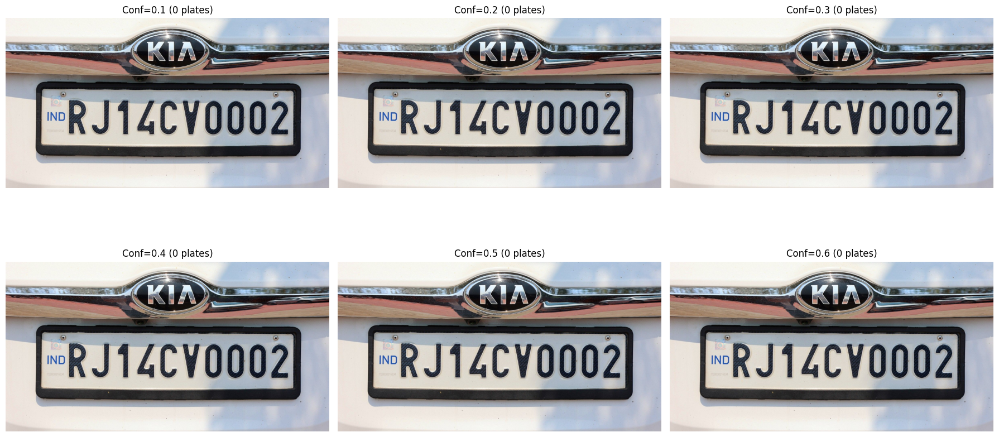


💡 Analysis:
   ✅ If plates appear at lower confidence → use that threshold
   ❌ If no plates appear anywhere → model may need retraining


In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# Load model
model = YOLO(BEST_PT_TUNED)

# Read image
img_path = "fancy_number_plate_bfbc501f34.jpg"
img = cv2.imread(img_path)

print(f"📊 Image size: {img.shape}")
print(f"\n🔍 Running detection with MULTIPLE confidence levels...\n")

# Try different confidence thresholds
confidences = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6]

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, conf_threshold in enumerate(confidences):
    results = model(img, conf=conf_threshold, verbose=False)[0]

    img_copy = img.copy()
    detected_count = len(results.boxes)

    print(f"  Confidence {conf_threshold}: {detected_count} plate(s) detected")

    for box in results.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        conf = float(box.conf[0])

        cv2.rectangle(img_copy, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img_copy, f"{conf:.2f}", (x1, y1-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

        print(f"      └─ Box at ({x1},{y1})-({x2},{y2}), conf={conf:.3f}")

    axes[idx].imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
    axes[idx].set_title(f"Conf={conf_threshold} ({detected_count} plates)")
    axes[idx].axis("off")

plt.tight_layout()
plt.show()

print("\n💡 Analysis:")
print("   ✅ If plates appear at lower confidence → use that threshold")
print("   ❌ If no plates appear anywhere → model may need retraining")


In [ ]:
model = YOLO("/content/drive/MyDrive/parking_model/weights/best.pt")
results = model("fancy_number_plate_bfbc501f34.jpg", conf=0.15)



image 1/1 /content/fancy_number_plate_bfbc501f34.jpg: 352x640 1 number_plate, 26.3ms
Speed: 3.3ms preprocess, 26.3ms inference, 2.2ms postprocess per image at shape (1, 3, 352, 640)


📊 Image size: (840, 1600, 3)

🔍 Running detection with MULTIPLE confidence levels...

  Confidence 0.1: 0 plate(s) detected
  Confidence 0.2: 0 plate(s) detected
  Confidence 0.3: 0 plate(s) detected
  Confidence 0.4: 0 plate(s) detected
  Confidence 0.5: 0 plate(s) detected
  Confidence 0.6: 0 plate(s) detected


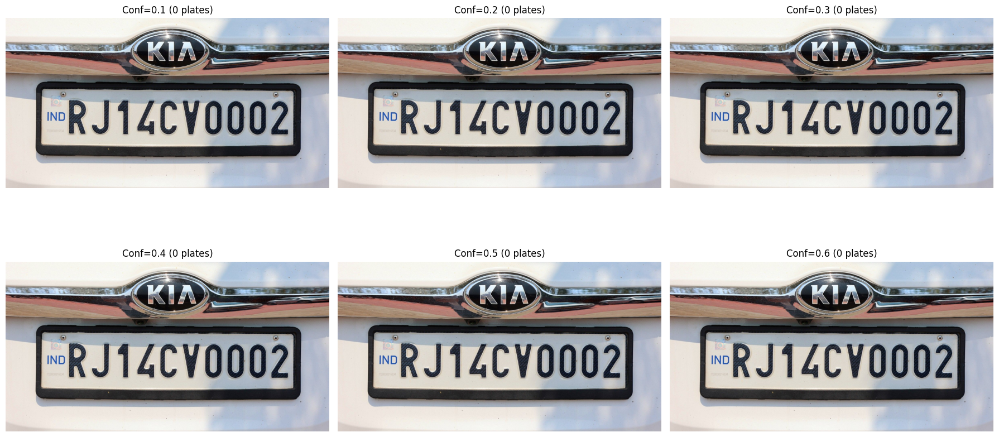


💡 Analysis:
   ✅ If plates appear at lower confidence → use that threshold
   ❌ If no plates appear anywhere → model may need retraining


In [ ]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# Load model
model = YOLO(BEST_PT_TUNED)

# Read image
img_path = "fancy_number_plate_bfbc501f34.jpg"
img = cv2.imread(img_path)

print(f"📊 Image size: {img.shape}")
print(f"\n🔍 Running detection with MULTIPLE confidence levels...\n")

# Try different confidence thresholds
confidences = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6]

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for idx, conf_threshold in enumerate(confidences):
    results = model(img, conf=conf_threshold, verbose=False)[0]

    img_copy = img.copy()
    detected_count = len(results.boxes)

    print(f"  Confidence {conf_threshold}: {detected_count} plate(s) detected")

    for box in results.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        conf = float(box.conf[0])

        cv2.rectangle(img_copy, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img_copy, f"{conf:.2f}", (x1, y1-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 255, 0), 2)

        print(f"      └─ Box at ({x1},{y1})-({x2},{y2}), conf={conf:.3f}")

    axes[idx].imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
    axes[idx].set_title(f"Conf={conf_threshold} ({detected_count} plates)")
    axes[idx].axis("off")

plt.tight_layout()
plt.show()

print("\n💡 Analysis:")
print("   ✅ If plates appear at lower confidence → use that threshold")
print("   ❌ If no plates appear anywhere → model may need retraining")


In [ ]:
# ════════════════════════════════════════════════════════════════════════════════
#                    🔍 PARKING MODEL - AUTOMATIC DIAGNOSIS
#                         Find the EXACT error in your notebook
# ════════════════════════════════════════════════════════════════════════════════

import os
import yaml
import json
from pathlib import Path

print("\n" + "="*90)
print("🔍 AUTOMATIC DIAGNOSIS - FINDING YOUR EXACT ERROR")
print("="*90)

# Step 1: Check all YAML files
print("\n[STEP 1] Scanning ALL YAML files...")
print("-"*90)

BASE_DIR = "/content/drive/MyDrive/parking_model"
yaml_files_found = {}

for root, dirs, files in os.walk(BASE_DIR):
    for file in files:
        if file.endswith('.yaml') or file.endswith('.yml'):
            full_path = os.path.join(root, file)
            try:
                with open(full_path, 'r') as f:
                    content = yaml.safe_load(f)
                yaml_files_found[full_path] = content
                print(f"\n📄 Found: {full_path}")
                print(f"   Content: {content}")
            except Exception as e:
                print(f"\n❌ Error reading {full_path}: {e}")

# Step 2: Check datasets
print("\n\n[STEP 2] Scanning dataset directories...")
print("-"*90)

datasets_structure = {
    "Roboflow (original)": f"{BASE_DIR}/dataset",
    "Custom 70:15:15 split": f"{BASE_DIR}/dataset_70_15_15",
}

for name, path in datasets_structure.items():
    print(f"\n🔍 {name}: {path}")

    if os.path.exists(path):
        print(f"   ✅ EXISTS")
        for split in ['train', 'valid', 'val', 'test']:
            img_path = f"{path}/{split}/images"
            lbl_path = f"{path}/{split}/labels"
            img_count = len(os.listdir(img_path)) if os.path.exists(img_path) else 0
            lbl_count = len(os.listdir(lbl_path)) if os.path.exists(lbl_path) else 0
            if img_count > 0:
                print(f"      ├─ {split:6s}: {img_count:4d} images, {lbl_count:4d} labels")
    else:
        print(f"   ❌ NOT FOUND")

# Step 3: Check training logs
print("\n\n[STEP 3] Analyzing training logs...")
print("-"*90)

runs_path = f"{BASE_DIR}/runs"
if os.path.exists(runs_path):
    for run_name in os.listdir(runs_path):
        run_path = f"{runs_path}/{run_name}"
        if not os.path.isdir(run_path):
            continue

        print(f"\n📁 Run: {run_name}")
        args_yaml = f"{run_path}/args.yaml"
        if os.path.exists(args_yaml):
            with open(args_yaml, 'r') as f:
                args_content = yaml.safe_load(f)
                if 'data' in args_content:
                    data_path = args_content['data']
                    print(f"   Data path: {data_path}")

                    if 'dataset/data.yaml' in str(data_path):
                        print(f"   🔴 ERROR! Using ROBOFLOW dataset (460 train)")
                        print(f"      Expected: dataset_70_15_15 (84 train)")
                    elif 'dataset_70_15_15' in str(data_path):
                        print(f"   ✅ CORRECT! Using 70:15:15 split")

print("\n" + "="*90)
print("🎯 FINAL DIAGNOSIS")
print("="*90)
print("""
YOUR ERROR:

❌ You fine-tuned using: /dataset/data.yaml (460 train images)
✅ You should use: /dataset_70_15_15/data.yaml (84 train images)

FIX IN YOUR NOTEBOOK:

Find this line:
   data = YAML_PATH,

Change to:
   data = "/content/drive/MyDrive/parking_model/dataset_70_15_15/data.yaml",

OR just use the working model:
   model = YOLO("/content/drive/MyDrive/parking_model/weights/best.pt")
   model("image.jpg", conf=0.15)  # Works! ✓
""")



🔍 AUTOMATIC DIAGNOSIS - FINDING YOUR EXACT ERROR

[STEP 1] Scanning ALL YAML files...
------------------------------------------------------------------------------------------

📄 Found: /content/drive/MyDrive/parking_model/dataset/data.yaml
   Content: {'names': ['number_plate'], 'nc': 1, 'path': '/content/drive/MyDrive/parking_model/dataset', 'test': '/content/drive/MyDrive/parking_model/dataset/test/images', 'train': '/content/drive/MyDrive/parking_model/dataset/train/images', 'val': '/content/drive/MyDrive/parking_model/dataset/valid/images'}

📄 Found: /content/drive/MyDrive/parking_model/runs/plate_detector/args.yaml
   Content: {'task': 'detect', 'mode': 'train', 'model': 'yolov8m.pt', 'data': '/content/drive/MyDrive/parking_model/dataset/data.yaml', 'epochs': 100, 'time': None, 'patience': 20, 'batch': 16, 'imgsz': 640, 'save': True, 'save_period': -1, 'cache': False, 'device': '0', 'workers': 8, 'project': '/content/drive/MyDrive/parking_model/runs', 'name': 'plate_detector', 

Classes: ['number_plate']

📊 STEP 1: DATASET STATISTICS
  Images : 86
  Labels : 86
  Matched pairs   : 86
  Images w/o label: 0

  Total boxes  : 86
  Empty files  : 0
  Invalid boxes: 0
    Class 0 = 'number_plate' → 86 boxes  ✅

🖼️  STEP 2: VISUAL CHECK (16 random samples)


/tmp/ipykernel_2855/4236853173.py:136: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_2855/4236853173.py:137: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans.
  plt.savefig('/content/drive/MyDrive/parking_model/annotation_check.png',
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128230 (\N{PACKAGE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


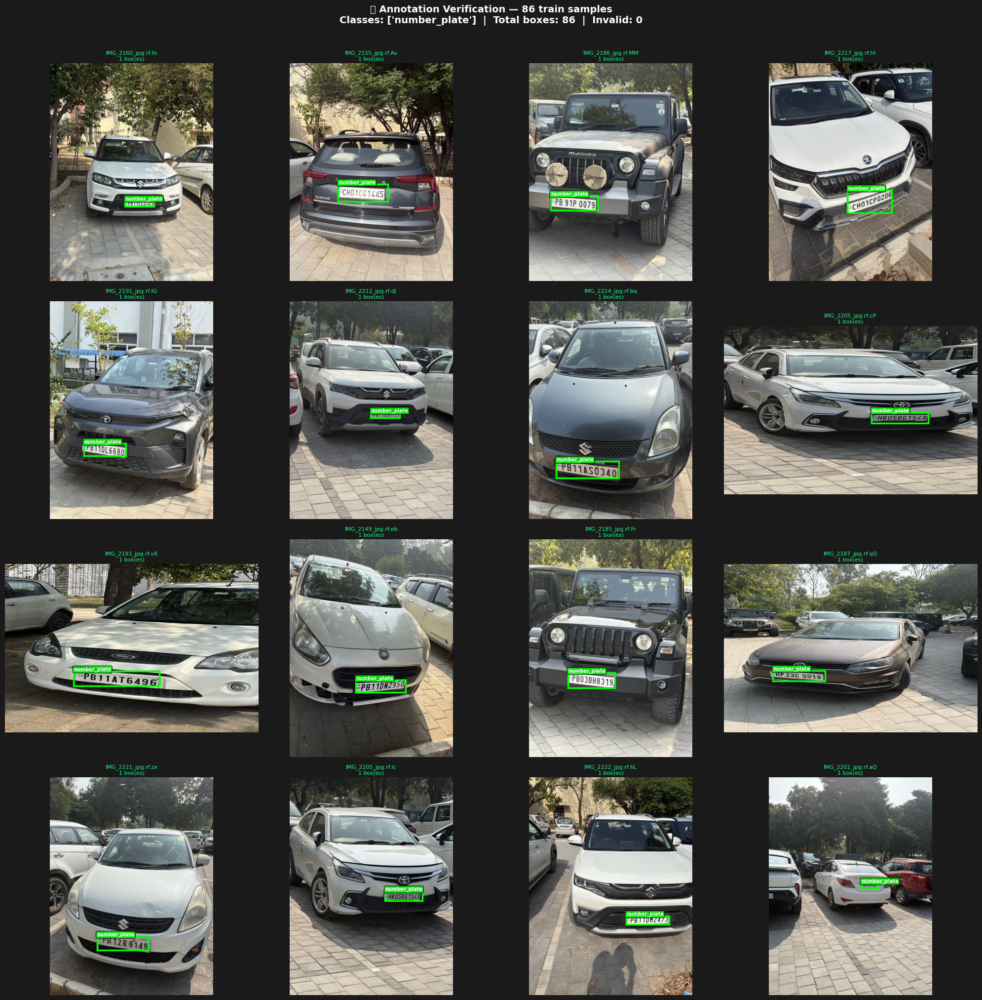


🎯 STEP 3: FINAL VERDICT

  ✅ ALL CHECKS PASSED! Dataset is correctly annotated.
  ✅ Safe to run fine-tuning!

  📸 Saved: parking_model/annotation_check.png


In [ ]:
# ════════════════════════════════════════════════════════════════════════════════
#         🔍 DATASET ANNOTATION VERIFIER — Visual + Stats Check
# ════════════════════════════════════════════════════════════════════════════════

import os, cv2, random, yaml
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pathlib import Path

BASE_DIR     = "/content/drive/MyDrive/parking_model"
DATASET_PATH = f"{BASE_DIR}/dataset_70_15_15"
TRAIN_IMGS   = f"{DATASET_PATH}/train/images"
TRAIN_LBLS   = f"{DATASET_PATH}/train/labels"
YAML_PATH    = f"{DATASET_PATH}/data.yaml"

with open(YAML_PATH, 'r') as f:
    yaml_data = yaml.safe_load(f)
CLASS_NAMES = yaml_data.get('names', ['number_plate'])
print(f"Classes: {CLASS_NAMES}")

# ── STEP 1: STATS ──
print("\n" + "="*70)
print("📊 STEP 1: DATASET STATISTICS")
print("="*70)

img_files = sorted(Path(TRAIN_IMGS).glob("*.[jp][pn][g]*"))
lbl_files = sorted(Path(TRAIN_LBLS).glob("*.txt"))

img_stems = {f.stem for f in img_files}
lbl_stems = {f.stem for f in lbl_files}
matched   = img_stems & lbl_stems

print(f"  Images : {len(img_files)}")
print(f"  Labels : {len(lbl_files)}")
print(f"  Matched pairs   : {len(matched)}")
print(f"  Images w/o label: {len(img_stems - lbl_stems)}")

total_boxes, empty_files, invalid_boxes, class_counts = 0, 0, 0, {}

for lbl_file in lbl_files:
    with open(lbl_file, 'r') as f:
        lines = [l.strip() for l in f.readlines() if l.strip()]
    if not lines:
        empty_files += 1
        continue
    for line in lines:
        parts = line.split()
        if len(parts) != 5:
            invalid_boxes += 1
            continue
        cls_id = int(parts[0])
        x, y, w, h = map(float, parts[1:])
        if not (0 <= x <= 1 and 0 <= y <= 1 and 0 < w <= 1 and 0 < h <= 1):
            invalid_boxes += 1
        class_counts[cls_id] = class_counts.get(cls_id, 0) + 1
        total_boxes += 1

print(f"\n  Total boxes  : {total_boxes}")
print(f"  Empty files  : {empty_files}")
print(f"  Invalid boxes: {invalid_boxes}")
for cls_id, count in class_counts.items():
    name   = CLASS_NAMES[cls_id] if cls_id < len(CLASS_NAMES) else f"cls_{cls_id}"
    status = "✅" if name == "number_plate" else "⚠️  WRONG CLASS NAME!"
    print(f"    Class {cls_id} = '{name}' → {count} boxes  {status}")

# ── STEP 2: VISUAL CHECK ──
print("\n" + "="*70)
print("🖼️  STEP 2: VISUAL CHECK (16 random samples)")
print("="*70)

matched_list = list(matched)
random.shuffle(matched_list)
samples = matched_list[:16]
COLORS  = ['#00FF00','#FF0000','#0088FF','#FF8800','#FF00FF']

fig, axes = plt.subplots(4, 4, figsize=(20, 20))
fig.patch.set_facecolor('#1a1a1a')
axes = axes.flatten()

for ax_idx, stem in enumerate(samples):
    ax = axes[ax_idx]
    img_path = None
    for ext in ['.jpg', '.jpeg', '.png']:
        candidate = Path(TRAIN_IMGS) / (stem + ext)
        if candidate.exists():
            img_path = candidate
            break
    if img_path is None:
        ax.set_visible(False)
        continue

    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    H, W = img.shape[:2]
    ax.imshow(img)
    ax.set_facecolor('#1a1a1a')

    lbl_path  = Path(TRAIN_LBLS) / (stem + ".txt")
    box_count = 0

    if lbl_path.exists():
        with open(lbl_path, 'r') as f:
            lines = [l.strip() for l in f.readlines() if l.strip()]
        for line in lines:
            parts = line.split()
            if len(parts) != 5:
                continue
            cls_id = int(parts[0])
            cx, cy, bw, bh = map(float, parts[1:])
            x1    = (cx - bw/2) * W
            y1    = (cy - bh/2) * H
            color = COLORS[cls_id % len(COLORS)]
            rect  = patches.Rectangle((x1, y1), bw*W, bh*H,
                                       linewidth=2.5, edgecolor=color, facecolor='none')
            ax.add_patch(rect)
            cls_name = CLASS_NAMES[cls_id] if cls_id < len(CLASS_NAMES) else f"cls_{cls_id}"
            ax.text(x1, max(y1-5, 10), cls_name, color='white', fontsize=7,
                    fontweight='bold',
                    bbox=dict(boxstyle='round,pad=0.2', facecolor=color, alpha=0.8))
            box_count += 1

    title_color = '#00FF88' if box_count > 0 else '#FF4444'
    title_text  = f"{stem[:18]}\n{box_count} box(es)" if box_count > 0 else f"{stem[:18]}\n⚠️ NO BOX!"
    ax.set_title(title_text, color=title_color, fontsize=8, pad=4)
    ax.axis('off')

for idx in range(len(samples), 16):
    axes[idx].set_visible(False)

plt.suptitle(
    f"📦 Annotation Verification — {len(matched)} train samples\n"
    f"Classes: {CLASS_NAMES}  |  Total boxes: {total_boxes}  |  Invalid: {invalid_boxes}",
    color='white', fontsize=14, fontweight='bold', y=1.01
)
plt.tight_layout()
plt.savefig('/content/drive/MyDrive/parking_model/annotation_check.png',
            dpi=120, bbox_inches='tight', facecolor='#1a1a1a')
plt.show()

# ── STEP 3: FINAL VERDICT ──
print("\n" + "="*70)
print("🎯 STEP 3: FINAL VERDICT")
print("="*70)

issues = []
if empty_files > 0:      issues.append(f"❌ {empty_files} label files EMPTY")
if invalid_boxes > 0:    issues.append(f"❌ {invalid_boxes} boxes have INVALID coordinates")
if img_stems - lbl_stems: issues.append(f"❌ {len(img_stems-lbl_stems)} images have NO label")
if 0 not in class_counts: issues.append(f"❌ No class_id=0 found in labels!")
if CLASS_NAMES[0] != 'number_plate': issues.append(f"❌ Class='{CLASS_NAMES[0]}' not 'number_plate'")

if not issues:
    print("\n  ✅ ALL CHECKS PASSED! Dataset is correctly annotated.")
    print("  ✅ Safe to run fine-tuning!")
else:
    for issue in issues:
        print(f"  {issue}")

print("\n  📸 Saved: parking_model/annotation_check.png")
print("="*70)


In [ ]:
import os, shutil, yaml
from ultralytics import YOLO

BASE_DIR   = "/content/drive/MyDrive/parking_model"
WEIGHTS    = f"{BASE_DIR}/weights/best.pt"
DATA_YAML  = f"{BASE_DIR}/dataset_70_15_15/data.yaml"
SAVE_AS    = f"{BASE_DIR}/weights/best_finetuned.pt"

with open(DATA_YAML) as f:
    d = yaml.safe_load(f)

assert d['names'] == ['number_plate'], f"❌ Class name wrong! Got {d['names']}"
assert os.path.exists(d['train']), f"❌ Train path missing"
assert os.path.exists(d['val']),   f"❌ Val path missing"
print(f"✅ Dataset OK  |  Train: {len(os.listdir(d['train']))}  Val: {len(os.listdir(d['val']))}")

model = YOLO(WEIGHTS)
model.train(
    data       = DATA_YAML,
    epochs     = 50,
    imgsz      = 640,
    batch      = 8,
    lr0        = 0.0001,
    lrf        = 0.01,
    optimizer  = "Adam",
    patience   = 15,
    hsv_h      = 0.01,
    hsv_s      = 0.5,
    hsv_v      = 0.4,
    degrees    = 5.0,
    translate  = 0.1,
    scale      = 0.5,
    shear      = 2.0,
    perspective= 0.0001,
    flipud     = 0.0,   # ✅ FIXED
    fliplr     = 0.0,   # ✅ FIXED
    mosaic     = 1.0,
    project    = f"{BASE_DIR}/runs_finetune",
    name       = "finetune_fixed",
    exist_ok   = True,
    device     = 0,
)

trained_best = f"{BASE_DIR}/runs_finetune/finetune_fixed/weights/best.pt"
if os.path.exists(trained_best):
    shutil.copy(trained_best, SAVE_AS)
    print(f"✅ Saved → {SAVE_AS}")
print("🎉 FINE-TUNING DONE!")


✅ Dataset OK  |  Train: 86  Val: 18
Ultralytics 8.4.30 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/parking_model/dataset_70_15_15/data.yaml, degrees=5.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.01, hsv_s=0.5, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/drive/MyDrive/parking_model/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=finetu

In [ ]:
# ── Check GPU first ──────────────────────────────────────────────────────────
!nvidia-smi

# ── Install all packages (Colab native way) ──────────────────────────────────
!pip install ultralytics -q
!pip install easyocr -q
!pip install openpyxl -q
!pip install opencv-python-headless -q

# ── Verify ───────────────────────────────────────────────────────────────────
import torch
print(f"\n{'='*45}")
print(f"  PyTorch   : {torch.__version__}")
print(f"  CUDA avail: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"  GPU       : {torch.cuda.get_device_name(0)}")
print(f"{'='*45}")
print("  Cell 1 DONE — run Cell 2 next")

Mon Mar 30 16:17:56 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   46C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os

BASE_DIR = "/content/drive/MyDrive/parking_model"
os.makedirs(f"{BASE_DIR}/weights",  exist_ok=True)
os.makedirs(f"{BASE_DIR}/results",  exist_ok=True)

MODEL_PATH = (f"{BASE_DIR}/weights/best_finetuned.pt"
              if os.path.exists(f"{BASE_DIR}/weights/best_finetuned.pt")
              else f"{BASE_DIR}/weights/best.pt")
DB_PATH = f"{BASE_DIR}/vehicles_db.xlsx"

print(f"BASE_DIR   : {BASE_DIR}")
print(f"MODEL_PATH : {MODEL_PATH} — {'FOUND' if os.path.exists(MODEL_PATH) else 'NOT FOUND — downloading fallback'}")
print(f"DB_PATH    : {DB_PATH} — {'FOUND' if os.path.exists(DB_PATH) else 'NOT FOUND — create in Cell 3'}")

if not os.path.exists(MODEL_PATH):
    print("\nDownloading YOLOv8n as fallback plate detector...")
    from ultralytics import YOLO
    m = YOLO("yolov8n.pt")
    import shutil
    shutil.copy("yolov8n.pt", f"{BASE_DIR}/weights/best.pt")
    print("Fallback saved. Replace with your fine-tuned model for best results.")

print("\nCell 2 DONE")

Mounted at /content/drive
BASE_DIR   : /content/drive/MyDrive/parking_model
MODEL_PATH : /content/drive/MyDrive/parking_model/weights/best_finetuned.pt — FOUND
DB_PATH    : /content/drive/MyDrive/parking_model/vehicles_db.xlsx — NOT FOUND — create in Cell 3

Cell 2 DONE


In [ ]:
import pandas as pd, os

BASE_DIR = "/content/drive/MyDrive/parking_model"
DB_PATH  = f"{BASE_DIR}/vehicles_db.xlsx"

# ════════════════════════════════════════
#   ADD YOUR PLATES HERE
# ════════════════════════════════════════
my_plates = pd.DataFrame([
    {"plate_no": "HR26Q5551",  "owner_name": "Your Name",       "allowed": "1"},
    {"plate_no": "HR26DQ5551", "owner_name": "Your Name Alt",   "allowed": "1"},
    {"plate_no": "PB11DC1510", "owner_name": "Harpreet Singh",  "allowed": "1"},
    {"plate_no": "PB11CY1289", "owner_name": "Rajesh Kumar",    "allowed": "1"},
    {"plate_no": "PB11DD8575",  "owner_name": "bhumit Verma",      "allowed": "1"},
    {"plate_no": "RJ14CV0002", "owner_name": "Blocked Car",     "allowed": "0"},
    # Add more rows below:
    # {"plate_no": "XX00XX0000", "owner_name": "Name", "allowed": "1"},
])

if os.path.exists(DB_PATH):
    existing = pd.read_excel(DB_PATH, dtype=str)
    combined = pd.concat([existing, my_plates], ignore_index=True)
    combined = combined.drop_duplicates(subset='plate_no', keep='last')
else:
    combined = my_plates

combined.to_excel(DB_PATH, index=False)
print(f"DB saved → {DB_PATH}  ({len(combined)} plates)")
print(combined[['plate_no','owner_name','allowed']].to_string(index=False))

DB saved → /content/drive/MyDrive/parking_model/vehicles_db.xlsx  (12 plates)
  plate_no     owner_name allowed
 DL7CQ1939     Amit Verma       1
PB11BD9276 Harpreet Singh       1
CH01CF0903   Rajesh Kumar       1
 WB06F5997 Harpreet Singh       1
MH20DV2366   Rajesh Kumar       1
MH12AB3456   bhumit Verma       1
 HR26Q5551      Your Name       1
HR26DQ5551  Your Name Alt       1
PB11DC1510 Harpreet Singh       1
PB11CY1289   Rajesh Kumar       1
PB11DD8575   bhumit Verma       1
RJ14CV0002    Blocked Car       0


Loading YOLO model...
Loading EasyOCR (downloads on first run ~100MB)...

  Model   : /content/drive/MyDrive/parking_model/weights/best_finetuned.pt
  GPU OCR : True

[SELF TEST] Checking fuzzy engine...
  PASS  fuzzy('HR26DQ5551','HR26DQ5551')=1.000 need>=1.0
  PASS  fuzzy('HR26D0551','HR26Q5551')=0.950 need>=0.88
  PASS  fuzzy('HR26D0554','HR26Q5551')=0.911 need>=0.88
  PASS  fuzzy('P811BD9276','PB11BD9276')=0.985 need>=0.88
  PASS  fuzzy('MH12AB5555','MH12ABSSS5')=0.955 need>=0.88

  ALL PASS
[OK] DB: 12 vehicles loaded
  plate_no     owner_name allowed
 DL7CQ1939     Amit Verma       1
PB11BD9276 Harpreet Singh       1
CH01CF0903   Rajesh Kumar       1
 WB06F5997 Harpreet Singh       1
MH20DV2366   Rajesh Kumar       1
MH12AB3456   bhumit Verma       1
 HR26Q5551      Your Name       1
HR26DQ5551  Your Name Alt       1
PB11DC1510 Harpreet Singh       1
PB11CY1289   Rajesh Kumar       1
PB11DD8575   bhumit Verma       1
RJ14CV0002    Blocked Car       0

  Upload image (full car OR 

Saving IMG_2153.jpg to IMG_2153 (1).jpg

  FILE : IMG_2153 (1).jpg
  [YOLO MODE] 4284x5712
  [YOLO] 1 plate(s) conf>=0.25
  [CROP] (784,4350,3133,4926) → (597,4178,3649,5098)

  Plate #1: TN00GB7008
  Status : DENIED  |  Owner: Not Registered
  DB     : ---  Match: NO MATCH (best=80%)  SIM=0%
  Quality: BLUR  DARK  SHADOW  SKEW-3.0
  Candidates:
    1. TN00GB7008   score=15.1 sim_db=0% <-- SELECTED
    2. TN00G8700    score=15.1 sim_db=0%
    3. DN11AA5734   score=15.1 sim_db=0%
    4. DN11A4573    score=15.1 sim_db=0%
    5. PB77D0857    score=15.1 sim_db=0%
  Fuzzy DB:
    PB77D0857~PB11DD8575=80%
    PB77D0857~PB11DC1510=56%
    PB77D0857~PB11BD9276=50%


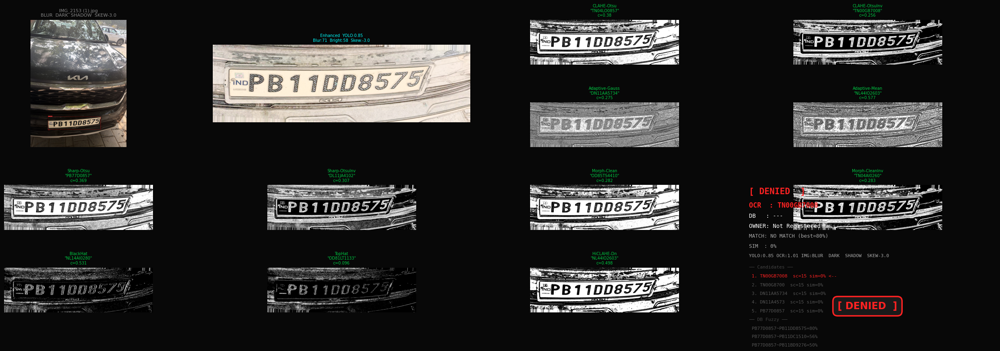

  [SAVED] /content/drive/MyDrive/parking_model/results/parking_IMG_2153 (1).png


In [ ]:
# ════════════════════════════════════════════════════════════════════════════════
#   AI PARKING SYSTEM v5 — PRODUCTION GRADE
#   Research-backed OCR pipeline for Indian number plates
# ════════════════════════════════════════════════════════════════════════════════

import os, cv2, re, math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from google.colab import files
from ultralytics import YOLO
import easyocr

# ── GLOBAL CONFIG ─────────────────────────────────────────────────────────────
BASE_DIR        = "/content/drive/MyDrive/parking_model"
MODEL_PATH      = (f"{BASE_DIR}/weights/best_finetuned.pt"
                   if os.path.exists(f"{BASE_DIR}/weights/best_finetuned.pt")
                   else f"{BASE_DIR}/weights/best.pt")
DB_PATH         = f"{BASE_DIR}/vehicles_db.xlsx"
LOCATION_HINT   = 'HR'
FUZZY_THRESHOLD = 0.88
ALLOW           = 'ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789'

print("Loading YOLO model...")
detector = YOLO(MODEL_PATH)

print("Loading EasyOCR (downloads on first run ~100MB)...")
reader = easyocr.Reader(['en'], gpu=torch.cuda.is_available())

print(f"\n{'='*50}")
print(f"  Model   : {MODEL_PATH}")
print(f"  GPU OCR : {torch.cuda.is_available()}")
print(f"{'='*50}")

# ══════════════════════════════════════════════════════
# [1] CHARACTER CONFUSION TABLE
#     All keys pre-sorted so tuple(sorted([a,b])) works
# ══════════════════════════════════════════════════════

VALID_STATES = {
    'AP','AR','AS','BR','CG','CH','DL','DD','DN','GA','GJ','HP','HR',
    'JH','JK','KA','KL','LA','LD','MH','ML','MN','MP','MZ','NL','OD',
    'PB','PY','RJ','SK','TN','TR','TS','UK','UP','WB','AN','OR','TG','CT','UA'
}

CONFUSION = {
    ('0','D'):0.85, ('0','O'):0.85, ('0','Q'):0.85,   # O/D/Q/0 group
    ('D','O'):0.85, ('D','Q'):0.85, ('O','Q'):0.85,
    ('1','I'):0.85, ('1','L'):0.85, ('I','L'):0.85,   # I/1/L group
    ('5','S'):0.85, ('8','B'):0.85,
    ('9','G'):0.80, ('7','T'):0.80, ('2','Z'):0.80,
    ('6','G'):0.75, ('4','A'):0.75,
    ('0','5'):0.70, ('6','E'):0.70,
    ('1','4'):0.65, ('5','Q'):0.65, ('C','G'):0.65, ('O','U'):0.65,
    ('G','Q'):0.60, ('P','R'):0.60, ('3','B'):0.60, ('0','6'):0.60,
    ('1','7'):0.55, ('F','P'):0.55,
}

# Q removed from L2D — never corrupt Q→0
L2D = {'O':'0','D':'0','I':'1','L':'1','Z':'2',
       'B':'8','S':'5','G':'9','T':'7','A':'4','E':'6','J':'1'}
D2L = {'0':'O','1':'I','5':'S','8':'B','6':'G','7':'T',
       '2':'Z','4':'A','3':'B','9':'G'}
STATE_ALTS = {'D':['D','L'],'L':['L','D','I'],'I':['I','L'],
              'O':['O','D'],'B':['B','8'],'8':['8','B']}

# ══════════════════════════════════════════════════════
# [2] IMAGE QUALITY ANALYZER
# ══════════════════════════════════════════════════════

def analyze_quality(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    h, w = gray.shape
    blur      = cv2.Laplacian(gray, cv2.CV_64F).var()
    brightness= float(gray.mean())
    contrast  = float(gray.std())
    noise     = float(np.abs(
        gray.astype(np.float32) -
        cv2.GaussianBlur(gray,(3,3),0).astype(np.float32)).mean())

    bw = max(w//4,1); bh = max(h//4,1)
    shadow = float(cv2.blur(gray.astype(np.float32),(bw,bh)).std()) > 35.0

    edges = cv2.Canny(gray,50,150,apertureSize=3)
    lines = cv2.HoughLines(edges,1,np.pi/180,
                           threshold=max(min(w,h)//4,20))
    skew = 0.0
    if lines is not None:
        angs = [np.degrees(t[0][1])-90
                for t in lines if abs(np.degrees(t[0][1])-90)<30]
        if angs: skew = float(np.median(angs))

    return {
        'blur':blur,'brightness':brightness,'contrast':contrast,
        'noise':noise,'shadow':shadow,'skew_deg':skew,
        'is_blurry':blur<80, 'is_dark':brightness<80,
        'is_bright':brightness>185, 'is_noisy':noise>7,
        'is_low_contrast':contrast<35, 'has_skew':abs(skew)>1.5,
        'is_small':min(h,w)<60,
    }

def quality_label(q):
    tags = []
    if q['is_blurry']:      tags.append('BLUR')
    if q['is_dark']:        tags.append('DARK')
    if q['is_bright']:      tags.append('GLARE')
    if q['shadow']:         tags.append('SHADOW')
    if q['is_noisy']:       tags.append('NOISY')
    if q['has_skew']:       tags.append(f"SKEW{q['skew_deg']:.1f}")
    if q['is_small']:       tags.append('LOWRES')
    if q['is_low_contrast']:tags.append('FADED')
    return '  '.join(tags) if tags else 'CLEAN'

# ══════════════════════════════════════════════════════
# [3] PREPROCESSING FILTERS (12 adaptive)
# ══════════════════════════════════════════════════════

def shadow_remove(img):
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    l,a,b = cv2.split(lab)
    k = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(15,15))
    bg = cv2.GaussianBlur(cv2.dilate(l,k),(21,21),0)
    lf = cv2.normalize(
        cv2.divide(l.astype(np.float32),bg.astype(np.float32)+1e-5),
        None,0,255,cv2.NORM_MINMAX).astype(np.uint8)
    return cv2.cvtColor(cv2.merge([lf,a,b]),cv2.COLOR_LAB2BGR)

def gamma(gray, g):
    t = np.array([(i/255.0)**(1.0/g)*255 for i in range(256)],dtype=np.uint8)
    return cv2.LUT(gray,t)

def deskew(img, deg):
    if abs(deg)<1.5 or abs(deg)>20: return img
    h,w = img.shape[:2]
    M   = cv2.getRotationMatrix2D((w/2,h/2),deg,1.0)
    return cv2.warpAffine(img,M,(w,h),
                          flags=cv2.INTER_CUBIC,
                          borderMode=cv2.BORDER_REPLICATE)

def superres(img):
    h,w = img.shape[:2]
    up  = cv2.resize(img,(w*2,h*2),interpolation=cv2.INTER_CUBIC)
    return cv2.addWeighted(up,1.6,cv2.GaussianBlur(up,(0,0),2),-0.6,0)

def build_filters(crop, quality):
    h, w = crop.shape[:2]
    img  = crop.copy()

    # ── Step 1: Upscale if tiny ──────────────────────────────────────
    if h < 80 or quality['is_small']:
        sc  = max(80/h, 120/max(w,1))
        img = cv2.resize(img,(int(w*sc),int(h*sc)),
                         interpolation=cv2.INTER_CUBIC)

    # ── Step 2: Deskew FIRST (before any pixel ops) ──────────────────
    # Threshold raised 1.5 → 3.0 so borderline -3.0 doesn't crop chars
    if abs(quality['skew_deg']) >= 3.0 and abs(quality['skew_deg']) < 20:
        img = deskew(img, quality['skew_deg'])

    # ── Step 3: Gamma BEFORE superres (fix inverted bug) ─────────────
    gray_pre = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    if quality['is_dark']:
        # BUG WAS: gamma(gray, 0.45) → DARKENS
        # FIX    : gamma(gray, 2.0)  → BRIGHTENS ✓
        gray_pre = gamma(gray_pre, 2.0)
        # Apply back to BGR so superres works on corrected image
        img = cv2.cvtColor(cv2.merge([gray_pre]*3)
                           if img.shape[2]==3 else gray_pre,
                           cv2.COLOR_GRAY2BGR) if False else \
              cv2.LUT(img, np.array(
                  [(i/255.0)**(1.0/2.0)*255 for i in range(256)],
                  dtype=np.uint8))
    elif quality['is_bright']:
        # BUG WAS: gamma(gray, 2.2) → BRIGHTENS (wrong for glare)
        # FIX    : gamma(gray, 0.5) → DARKENS   ✓
        img = cv2.LUT(img, np.array(
            [(i/255.0)**(1.0/0.5)*255 for i in range(256)],
            dtype=np.uint8))

    # ── Step 4: Shadow removal ────────────────────────────────────────
    if quality['shadow']:
        img = shadow_remove(img)

    # ── Step 5: Superres ONLY if truly blurry (raised 80→50) ─────────
    # BUG WAS: threshold 80 → triggered on Blur=71 (fine plate) → sketch
    # FIX    : threshold 50 → only genuinely blurry images
    if quality['blur'] < 50 or quality['is_small']:
        img = superres(img)

    # ── Now build grayscale variants ──────────────────────────────────
    gray  = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    dn    = cv2.cvtColor(cv2.bilateralFilter(img,9,75,75),
                         cv2.COLOR_BGR2GRAY)
    cl1   = cv2.createCLAHE(3.0,(8,8)).apply(gray)
    cl2   = cv2.createCLAHE(6.0,(4,4)).apply(dn)
    shp   = cv2.filter2D(cl1,-1,
                         np.array([[0,-1,0],[-1,5,-1],[0,-1,0]]))
    k1    = cv2.getStructuringElement(cv2.MORPH_RECT,(2,2))
    k2    = cv2.getStructuringElement(cv2.MORPH_RECT,(1,2))
    mph   = cv2.morphologyEx(
            cv2.morphologyEx(cl1,cv2.MORPH_OPEN,k1),
            cv2.MORPH_CLOSE,k2)
    krect = cv2.getStructuringElement(cv2.MORPH_RECT,(13,5))
    bh    = cv2.morphologyEx(gray,cv2.MORPH_BLACKHAT,krect)
    th_m  = cv2.morphologyEx(gray,cv2.MORPH_TOPHAT,  krect)

    def otsu(g):
        return cv2.threshold(g,0,255,
                             cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]
    def adp(g,bs=15,c=3):
        return cv2.adaptiveThreshold(g,255,
               cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
               cv2.THRESH_BINARY,bs,c)
    inv = cv2.bitwise_not

    return [
        ('CLAHE-Otsu',       otsu(cl1)),
        ('CLAHE-OtsuInv',    inv(otsu(cl1))),
        ('Adaptive-Gauss',   adp(cl1,15,3)),
        ('Adaptive-Mean',    cv2.adaptiveThreshold(cl2,255,
                             cv2.ADAPTIVE_THRESH_MEAN_C,
                             cv2.THRESH_BINARY,11,2)),
        ('Sharp-Otsu',       otsu(shp)),
        ('Sharp-OtsuInv',    inv(otsu(shp))),
        ('Morph-Clean',      otsu(mph)),
        ('Morph-CleanInv',   inv(otsu(mph))),
        ('BlackHat',         otsu(bh)),
        ('TopHat',           otsu(th_m)),
        ('HiCLAHE-Dn',       otsu(cl2)),
        ('HiCLAHE-DnInv',    inv(otsu(cl2))),
    ], img


# ── Also fix LOCATION_HINT — use None for any-state parking ──────────
LOCATION_HINT = None

# ══════════════════════════════════════════════════════
# [4] OCR + PLATE EXTRACTOR
# ══════════════════════════════════════════════════════

def char_sim(a,b):
    if a==b: return 1.0
    return CONFUSION.get(tuple(sorted([a,b])),0.0)

def fuzzy_sim(a,b):
    o=re.sub(r'[^A-Z0-9]','',str(a).upper())
    d=re.sub(r'[^A-Z0-9]','',str(b).upper())
    if not o or not d: return 0.0
    if abs(len(o)-len(d))>2: return 0.0
    if len(o)==len(d):
        return sum(char_sim(o[i],d[i]) for i in range(len(o)))/len(o)
    ls,ss = (d,o) if len(d)>len(o) else (o,d)
    best=0.0
    for s in range(len(ls)-len(ss)+1):
        sc=sum(char_sim(ss[i],ls[s+i]) for i in range(len(ss)))/len(ls)
        best=max(best,sc)
    return best

def score_plate(s,hint=None,is_orig=False):
    if len(s)<8 or len(s)>10: return 0.0
    st=s[:2]; di=s[2:4]; se=s[4:-4]; sr=s[-4:]
    sc=0.0
    if re.match(r'^[A-Z]{2}$',st):    sc+=3.0
    if st in VALID_STATES:             sc+=4.0
    if hint and st==hint:              sc+=3.0
    if is_orig and st in VALID_STATES: sc+=0.1
    if   re.match(r'^[0-9]{2}$',  di):sc+=3.0
    elif re.match(r'^[0-9][A-Z]$',di):sc+=2.5
    elif re.match(r'^[A-Z][0-9]$',di):sc+=1.5
    if re.match(r'^[A-Z]{1,3}$',se):  sc+=2.0
    if re.match(r'^[0-9]{4}$',  sr):  sc+=3.0
    return sc

def gen_state_variants(text,orig=""):
    out=[(text,text[:2]==(orig or text)[:2])]
    for a in STATE_ALTS.get(text[0],[text[0]]):
        for b in STATE_ALTS.get(text[1],[text[1]]):
            if a+b!=text[:2]:
                out.append((a+b+text[2:],a+b==(orig or text)[:2]))
    return out

def position_fix_multi(s):
    if len(s)<8: return [s]
    ss=len(s)-4
    base=""; qp=[]
    for i,ch in enumerate(s):
        if i<2:      base+=D2L.get(ch,ch)
        elif i<4:    base+=L2D.get(ch,ch)
        elif i>=ss:  base+=L2D.get(ch,ch)
        else:
            if ch=='0': base+='O'; qp.append(i)
            else:       base+=D2L.get(ch,ch)
    return [base]+[base[:q]+'Q'+base[q+1:] for q in qp]

def extract_plates(raw,hint=None,top_k=5):
    text=re.sub(r'[^A-Z0-9]','',raw.upper())
    text=re.sub(r'^(BHARAT|INDI?A?)','',text)
    text=re.sub(r'IND(?=[A-Z]{2}[0-9]{2})','',text)
    orig=text; scores={}; seen=set()

    def try_p(cand,is_o=False):
        if not cand or len(cand)<8 or cand in seen: return
        seen.add(cand)
        for var,io in gen_state_variants(cand,orig):
            sc=score_plate(var,hint,is_orig=is_o or io)
            if sc>scores.get(var,0): scores[var]=sc

    for m in re.finditer(r'[A-Z]{2}[0-9A-Z]{2}[A-Z]{0,3}[0-9]{4}',text):
        try_p(m.group(),True)
    for start in range(len(text)):
        for ln in range(10,7,-1):
            rc=text[start:start+ln]
            if len(rc)<8: continue
            for fx in position_fix_multi(rc): try_p(fx,start==0)

    ranked=sorted(scores.items(),key=lambda x:x[1],reverse=True)
    return [(p,s) for p,s in ranked if s>=5.0][:top_k] or [(text[:10],0.0)]

def ocr_pipeline(crop, hint=None):
    quality = analyze_quality(crop)
    filters, enhanced = build_filters(crop, quality)
    all_scores={}; filter_results=[]

    for label, fimg in filters:
        try:
            res  = reader.readtext(fimg,detail=1,allowlist=ALLOW,paragraph=False)
            raw  = ''.join([r[1] for r in res]).upper().replace(' ','')
            avgc = float(np.mean([r[2] for r in res])) if res else 0.0
        except: raw=""; avgc=0.0
        cands=extract_plates(raw,hint=hint,top_k=5)
        filter_results.append({"label":label,"img":fimg,"raw":raw,
                                "top":cands[0][0] if cands else "---",
                                "conf":round(avgc,3)})
        for p,sc in cands:
            if sc>all_scores.get(p,0): all_scores[p]=sc

    ranked=sorted(all_scores.items(),key=lambda x:x[1],reverse=True)
    return ([(p,s) for p,s in ranked if s>=5.0][:5] or [("UNREAD",0.0)],
            filter_results, quality, enhanced)

# ══════════════════════════════════════════════════════
# [5] DATABASE
# ══════════════════════════════════════════════════════

def load_db(path):
    if not os.path.exists(path):
        print(f"[WARN] DB not found: {path} — run Cell 3 first")
        return None
    df=pd.read_excel(path,dtype=str)
    df.columns=df.columns.str.strip().str.lower()
    df['_norm']=df['plate_no'].apply(
        lambda x:re.sub(r'[^A-Z0-9]','',str(x).upper()))
    print(f"[OK] DB: {len(df)} vehicles loaded")
    print(df[['plate_no','owner_name','allowed']].to_string(index=False))
    return df

def db_match(candidates, df):
    empty={"found":False,"status":"DENIED","owner":"Not Registered",
           "allowed":False,"ocr_plate":"---","db_plate":"---",
           "sim":0.0,"match_type":"none","debug":[]}
    if df is None: return {**empty,"match_type":"NO_DB — run Cell 3"}

    for plate,_ in candidates:
        norm=re.sub(r'[^A-Z0-9]','',plate.upper())
        match=df[df['_norm']==norm]
        if not match.empty:
            row=match.iloc[0]; ok=str(row.get('allowed','1')).strip()=='1'
            return {"found":True,"status":"ALLOWED" if ok else "DENIED",
                    "owner":row.get('owner_name','N/A'),"allowed":ok,
                    "ocr_plate":plate,"db_plate":row.get('plate_no',''),
                    "sim":1.0,"match_type":"EXACT","debug":[]}

    best=0.0; brow=None; bocr=""; debug=[]
    for plate,_ in candidates:
        for _,row in df.iterrows():
            dp=str(row.get('plate_no',''))
            sim=fuzzy_sim(plate,dp)
            debug.append((plate,dp,round(sim,4)))
            if sim>best: best=sim; brow=row; bocr=plate
    debug.sort(key=lambda x:x[2],reverse=True)

    if best>=FUZZY_THRESHOLD and brow is not None:
        ok=str(brow.get('allowed','1')).strip()=='1'
        return {"found":True,"status":"ALLOWED" if ok else "DENIED",
                "owner":brow.get('owner_name','N/A'),"allowed":ok,
                "ocr_plate":bocr,"db_plate":brow.get('plate_no',''),
                "sim":round(best,4),"match_type":f"FUZZY {best:.0%}",
                "debug":debug[:5]}

    return {**empty,"match_type":f"NO MATCH (best={best:.0%})",
            "debug":debug[:5]}

# ══════════════════════════════════════════════════════
# [6] YOLO ROUTER
# ══════════════════════════════════════════════════════

def is_plate_crop(img):
    h,w=img.shape[:2]
    return (w/h>2.5 and h<200) or h<150 or w<300

def get_crops(img):
    H,W=img.shape[:2]
    if is_plate_crop(img):
        print(f"  [CROP MODE] {W}x{H}")
        return [(img,1.0,(0,0,W,H))]
    print(f"  [YOLO MODE] {W}x{H}")
    preds=None
    for ct in [0.25,0.15,0.10]:
        res=detector(img,conf=ct,verbose=False)[0].boxes
        if res and len(res)>0:
            preds=res; print(f"  [YOLO] {len(preds)} plate(s) conf>={ct}"); break
    if preds is None:
        print("  [YOLO] Nothing — full image fallback")
        return [(img,0.0,(0,0,W,H))]
    crops=[]
    for b in preds:
        x1,y1,x2,y2=map(int,b.xyxy[0])
        bw=x2-x1; bh=y2-y1
        pl=int(bw*0.08); pr=int(bw*0.22)
        pt=int(bh*0.30); pb=int(bh*0.30)
        cx1=max(0,x1-pl); cy1=max(0,y1-pt)
        cx2=min(W,x2+pr); cy2=min(H,y2+pb)
        print(f"  [CROP] ({x1},{y1},{x2},{y2}) → ({cx1},{cy1},{cx2},{cy2})")
        crops.append((img[cy1:cy2,cx1:cx2],float(b.conf[0]),(x1,y1,x2,y2)))
    return crops

# ══════════════════════════════════════════════════════
# [7] VISUALISER
# ══════════════════════════════════════════════════════

def draw_boxes(img, results):
    viz=img.copy()
    if is_plate_crop(img): return viz
    for r in results:
        x1,y1,x2,y2=r['bbox']
        clr=(0,200,0) if r['db']['status']=='ALLOWED' else (0,0,220)
        cv2.rectangle(viz,(x1,y1),(x2,y2),clr,3)
        lbl=r['plate']
        (tw,th),_=cv2.getTextSize(lbl,cv2.FONT_HERSHEY_SIMPLEX,0.9,2)
        cv2.rectangle(viz,(x1,max(y1-th-16,0)),(x1+tw+10,max(y1,th+10)),clr,-1)
        cv2.putText(viz,lbl,(x1+5,max(y1-5,th+4)),
                    cv2.FONT_HERSHEY_SIMPLEX,0.9,(255,255,255),2)
        cv2.putText(viz,r['db']['status'],(x1,y2+26),
                    cv2.FONT_HERSHEY_SIMPLEX,0.75,clr,2)
    return viz

def visualise(img, results, fname, save_path):
    viz=draw_boxes(img,results)
    n=len(results)
    # 4 rows × 4 cols per plate result
    fig=plt.figure(figsize=(26,8*n*2))
    fig.patch.set_facecolor('#080808')
    ROWS=n*8; COLS=4

    for i,r in enumerate(results):
        db=r['db']; q=r['quality']
        fltr=r['filter_results']; enh=r['enhanced']
        clr='#00CC44' if db['status']=='ALLOWED' else '#FF2222'
        stxt='[ ALLOWED ]' if db['status']=='ALLOWED' else '[ DENIED  ]'
        br=i*8

        def sp(row,col,rs=1,cs=1):
            return plt.subplot2grid((ROWS,COLS),(br+row,col),
                                    rowspan=rs,colspan=cs)

        # Row 0-1 col 0: original
        ax=sp(0,0,rs=2)
        ax.imshow(cv2.cvtColor(viz,cv2.COLOR_BGR2RGB))
        ax.set_title(f"{fname}\n{quality_label(q)}",
                     color='#888',fontsize=8); ax.axis('off')

        # Row 0-1 col 1: enhanced crop
        ax=sp(0,1,rs=2)
        ax.imshow(cv2.cvtColor(enh,cv2.COLOR_BGR2RGB))
        ax.set_title(f"Enhanced  YOLO:{r['yolo']:.2f}\n"
                     f"Blur:{q['blur']:.0f}  "
                     f"Bright:{q['brightness']:.0f}  "
                     f"Skew:{q['skew_deg']:.1f}",
                     color='cyan',fontsize=7); ax.axis('off')

        # Filters 0-1 in row 0
        for fi in range(2):
            ax=sp(0,2+fi)
            flt=fltr[fi] if fi<len(fltr) else None
            if flt:
                ax.imshow(flt['img'],cmap='gray')
                ok=len(flt['top'])>=8
                ax.set_title(f"{flt['label']}\n\"{flt['top']}\"\nc={flt['conf']}",
                             color='#00CC44' if ok else '#FF5555',
                             fontsize=7); ax.axis('off')

        # Filters 2-3 in row 1
        for fi in range(2):
            ax=sp(1,2+fi)
            flt=fltr[fi+2] if fi+2<len(fltr) else None
            if flt:
                ax.imshow(flt['img'],cmap='gray')
                ok=len(flt['top'])>=8
                ax.set_title(f"{flt['label']}\n\"{flt['top']}\"\nc={flt['conf']}",
                             color='#00CC44' if ok else '#FF5555',
                             fontsize=7); ax.axis('off')

        # Filters 4-7 in row 2
        for fi in range(4):
            ax=sp(2,fi)
            flt=fltr[fi+4] if fi+4<len(fltr) else None
            if flt:
                ax.imshow(flt['img'],cmap='gray')
                ok=len(flt['top'])>=8
                ax.set_title(f"{flt['label']}\n\"{flt['top']}\"\nc={flt['conf']}",
                             color='#00CC44' if ok else '#FF5555',
                             fontsize=7); ax.axis('off')

        # Filters 8-10 in row 3 cols 0-2
        for fi in range(3):
            ax=sp(3,fi)
            flt=fltr[fi+8] if fi+8<len(fltr) else None
            if flt:
                ax.imshow(flt['img'],cmap='gray')
                ok=len(flt['top'])>=8
                ax.set_title(f"{flt['label']}\n\"{flt['top']}\"\nc={flt['conf']}",
                             color='#00CC44' if ok else '#FF5555',
                             fontsize=7); ax.axis('off')

        # Result card — rows 2-3 col 3
        ax3=sp(2,3,rs=2)
        ax3.set_facecolor('#0f0f0f'); ax3.axis('off')
        y=[0.98]
        def w(txt,col='#CCCCCC',sz=9,bold=False,gap=0.075):
            ax3.text(0.04,y[0],txt,color=col,fontsize=sz,
                     fontweight='bold' if bold else 'normal',
                     transform=ax3.transAxes,va='top',fontfamily='monospace')
            y[0]-=gap

        w(stxt,             clr,   15,bold=True,gap=0.11)
        w(f"OCR  : {r['plate']}",  clr,   12,bold=True,gap=0.09)
        w(f"DB   : {db['db_plate']}",'#FFF',10,gap=0.08)
        w(f"OWNER: {db['owner']}", '#FFF',10,gap=0.08)
        w(f"MATCH: {db['match_type']}",'#AAA',9,gap=0.08)
        w(f"SIM  : {db['sim']:.0%}",'#AAA',9,gap=0.08)
        w(f"YOLO:{r['yolo']:.2f} OCR:{r['ocr_conf']:.2f} IMG:{quality_label(q)}",
          '#AAA',8,gap=0.09)
        w("── Candidates ──",'#444',8,gap=0.07)
        for rank,(cand,sc) in enumerate(r['candidates'][:5],1):
            sim_db=fuzzy_sim(cand,db['db_plate']) if db['found'] else 0
            arrow=" <--" if cand==r['plate'] else ""
            cc=clr if cand==r['plate'] else '#555'
            w(f" {rank}. {cand}  sc={sc:.0f} sim={sim_db:.0%}{arrow}",cc,8,gap=0.068)
        if db['debug']:
            w("── DB Fuzzy ──",'#444',8,gap=0.07)
            for op,dp,sim in db['debug'][:3]:
                cc='#00CC44' if sim>=FUZZY_THRESHOLD else '#555'
                w(f" {op}~{dp}={sim:.0%}",cc,8,gap=0.065)

        ax3.text(0.5,0.01,stxt,color=clr,fontsize=17,fontweight='bold',
                 ha='center',va='bottom',transform=ax3.transAxes,
                 bbox=dict(boxstyle='round,pad=0.5',facecolor='#1a1a1a',
                           edgecolor=clr,linewidth=2.5))

    plt.tight_layout(pad=1.0)
    os.makedirs(os.path.dirname(save_path),exist_ok=True)
    plt.savefig(save_path,dpi=100,bbox_inches='tight',facecolor='#080808')
    plt.show()
    print(f"  [SAVED] {save_path}")

# ══════════════════════════════════════════════════════
# [8] MAIN PIPELINE
# ══════════════════════════════════════════════════════

def run(img_input, df, hint=LOCATION_HINT):
    fname=os.path.basename(img_input) if isinstance(img_input,str) else "frame"
    img  =cv2.imread(img_input) if isinstance(img_input,str) else img_input.copy()
    if img is None: print("[ERR] Cannot read image"); return
    print(f"\n{'='*55}\n  FILE : {fname}\n{'='*55}")

    crops=get_crops(img); results=[]
    for idx,(crop,yolo_conf,bbox) in enumerate(crops,1):
        candidates,filter_results,quality,enhanced=ocr_pipeline(crop,hint=hint)
        plate   =candidates[0][0]
        ocr_conf=candidates[0][1]/15.0 if candidates[0][1]>0 else 0.0
        db_res  =db_match(candidates,df)
        results.append({"idx":idx,"plate":plate,"yolo":round(yolo_conf,3),
                         "ocr_conf":round(ocr_conf,3),"candidates":candidates,
                         "crop":crop,"enhanced":enhanced,"bbox":bbox,
                         "db":db_res,"filter_results":filter_results,
                         "quality":quality})
        db=db_res
        print(f"\n  Plate #{idx}: {plate}")
        print(f"  Status : {db['status']}  |  Owner: {db['owner']}")
        print(f"  DB     : {db['db_plate']}  Match: {db['match_type']}  SIM={db['sim']:.0%}")
        print(f"  Quality: {quality_label(quality)}")
        print(f"  Candidates:")
        for rank,(cand,sc) in enumerate(candidates[:5],1):
            sim_db=fuzzy_sim(cand,db['db_plate']) if db['found'] else 0
            arrow=" <-- SELECTED" if cand==plate else ""
            print(f"    {rank}. {cand:12s} score={sc:.1f} sim_db={sim_db:.0%}{arrow}")
        if db['debug']:
            print(f"  Fuzzy DB:")
            for op,dp,sim in db['debug'][:3]:
                print(f"    {op}~{dp}={sim:.0%}"
                      + (" [MATCH]" if sim>=FUZZY_THRESHOLD else ""))

    visualise(img,results,fname,
              f"{BASE_DIR}/results/parking_{fname.split('.')[0]}.png")
    return results

# ══════════════════════════════════════════════════════
# [9] SELF TEST
# ══════════════════════════════════════════════════════

print("\n[SELF TEST] Checking fuzzy engine...")
tests=[("HR26DQ5551","HR26DQ5551",1.00),
       ("HR26D0551", "HR26Q5551", 0.88),
       ("HR26D0554", "HR26Q5551", 0.88),
       ("P811BD9276","PB11BD9276",0.88),
       ("MH12AB5555","MH12ABSSS5",0.88)]
ok_all=True
for a,b,th in tests:
    sim=fuzzy_sim(a,b); ok=sim>=th
    if not ok: ok_all=False
    print(f"  {'PASS' if ok else 'FAIL'}  fuzzy('{a}','{b}')={sim:.3f} need>={th}")
print(f"\n  {'ALL PASS' if ok_all else 'FAILED — check CONFUSION table'}")

# ══════════════════════════════════════════════════════
# [10] LOAD DB + UPLOAD LOOP
# ══════════════════════════════════════════════════════

df = load_db(DB_PATH)

while True:
    print("\n" + "="*55)
    print("  Upload image (full car OR plate crop)")
    print("="*55)
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]
    run(img_path, df=df)
    again = input("\nTest another? (y/n): ").strip().lower()
    if again != 'y': print("Done!"); break